Installing libraries

In [6]:
!pip install torch torchvision albumentations timm


Cloning model's repository

In [7]:
!rm -rf /content/MNv4-fpn
!git clone https://github.com/xwd2019/MNv4-fpn.git

Cloning into 'MNv4-fpn'...
remote: Enumerating objects: 12, done.
remote: Counting objects: 100% (12/12), done.
remote: Compressing objects: 100% (11/11), done.
remote: Total 12 (delta 3), reused 0 (delta 0), pack-reused 0 (from 0)
Receiving objects: 100% (12/12), 8.59 KiB | 8.59 MiB/s, done.
Resolving deltas: 100% (3/3), done.


Imports

In [8]:
import torch
from torch.utils.data import DataLoader, Subset
import albumentations as A
from albumentations.pytorch import ToTensorV2
import numpy as np
from torch.utils.data import Dataset
from PIL import Image
import os
from google.colab import drive
import sys
import torch.nn as nn
import torch.optim as optim
from tqdm import tqdm
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix


Fixing model's imports

In [9]:
# Fixing relative imports in repo
!cd /content/MNv4-fpn && sed -i 's/from \./from /g' *.py
sys.path.insert(0, '/content/MNv4-fpn')
from seg import Seg

Mounting and data pairing

In [10]:
drive.mount('/content/drive')




Mounted at /content/drive


In [11]:
!ln -s /content/drive/MyDrive/microplastics /content/data

In [12]:
images_path = '/content/data/images'
masks_path = '/content/data/masks'

image_files = sorted(os.listdir(images_path))
mask_files = sorted(os.listdir(masks_path))
paired_image_files = [img for img in image_files if img in set(mask_files)]

print(f"Count of paired images: {len(paired_image_files)}")

Count of paired images: 403


Calculating mean and std

In [13]:
def calculate_dataset_stats(image_files, images_path):
    means = []
    stds = []

    for img_file in image_files:
        img = Image.open(os.path.join(images_path, img_file)).convert('RGB')
        img = np.array(img) / 255.0

        means.append(img.mean(axis=(0, 1)))
        stds.append(img.std(axis=(0, 1)))

    dataset_mean = np.mean(means, axis=0)
    dataset_std = np.mean(stds, axis=0)

    return dataset_mean.tolist(), dataset_std.tolist()

MEAN, STD = calculate_dataset_stats(paired_image_files, images_path)
print(f"Dataset mean: {MEAN}")
print(f"Dataset std: {STD}")

Dataset mean: [0.7059140755261906, 0.7096701363145624, 0.7028037838470678]
Dataset std: [0.04292269066694413, 0.04979341462785254, 0.04669112573302777]



Microplastics dataset

In [14]:
class MicroplasticsDataset(Dataset):
    def __init__(self, images_path, masks_path, image_files, transform=None):
        self.images_path = images_path
        self.masks_path = masks_path
        self.image_files = image_files
        self.transform = transform

    def __len__(self):
        return len(self.image_files)

    def __getitem__(self, idx):
        img_file = self.image_files[idx]

        img = Image.open(os.path.join(self.images_path, img_file)).convert('RGB')
        mask = Image.open(os.path.join(self.masks_path, img_file)).convert('L')

        img = np.array(img)
        mask = np.array(mask)

        # Binarize mask
        mask = (mask > 127).astype(np.uint8)

        if self.transform:
            transformed = self.transform(image=img, mask=mask)
            img = transformed['image']
            mask = transformed['mask']

            # ensuring mask is a tensor
            if not isinstance(mask, torch.Tensor):
                mask = torch.from_numpy(mask)
            mask = mask.long()
        else:
            img = torch.from_numpy(img).permute(2, 0, 1).float()
            mask = torch.from_numpy(mask).long()

        return img, mask

 Hyperparameters and configuration

In [15]:
# Hyperparameters based on the third study (Yao et al., 2025)
BATCH_SIZE = 8
NUM_CLASSES = 2
NUM_EPOCHS = 100
LEARNING_RATE_MIN = 0
LEARNING_RATE_MAX = 0.0001
WEIGHT_DECAY = 0.0001 # Adopted from the first study (Han et al., 2023)
LOSS_ALPHA = 0.4 # For combined loss

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Using device: {device}")

Using device: cuda


Train validation test split

In [16]:
total_samples = len(paired_image_files)
train_size = int(0.70 * total_samples)
val_size = int(0.15 * total_samples)
test_size = total_samples - train_size - val_size

# Set random seed for reproducibility
torch.manual_seed(571)
np.random.seed(571)

all_indices = np.random.permutation(total_samples)
train_indices = all_indices[:train_size]
val_indices = all_indices[train_size:train_size + val_size]
test_indices = all_indices[train_size + val_size:]

train_image_files = [paired_image_files[i] for i in train_indices]
val_image_files = [paired_image_files[i] for i in val_indices]
test_image_files = [paired_image_files[i] for i in test_indices]

Dataloaders

In [17]:
# Data augmentations for training (based on Yao et al., 2025)
train_transform = A.Compose([
    A.Resize(height=480, width=640),
    A.HorizontalFlip(p=0.5),
    A.VerticalFlip(p=0.5),
    A.RandomRotate90(p=0.5),
    A.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.1, p=0.5),
    A.GaussianBlur(blur_limit=(3, 7), p=0.3),
    A.Resize(height=480, width=640),
    A.Normalize(mean=MEAN, std=STD),
    ToTensorV2()
])

# No augmentations for validation and test sets
val_test_transform = A.Compose([
    A.Resize(height=480, width=640),
    A.Normalize(mean=MEAN, std=STD),
    ToTensorV2()
])

train_dataset = MicroplasticsDataset(
    images_path,
    masks_path,
    train_image_files,
    transform=train_transform
)

val_dataset = MicroplasticsDataset(
    images_path,
    masks_path,
    val_image_files,
    transform=val_test_transform
)

test_dataset = MicroplasticsDataset(
    images_path,
    masks_path,
    test_image_files,
    transform=val_test_transform
)

train_loader = DataLoader(
    train_dataset,
    batch_size=BATCH_SIZE,
    shuffle=True,
    num_workers=2,
    pin_memory=True
)

val_loader = DataLoader(
    val_dataset,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=2,
    pin_memory=True
)

test_loader = DataLoader(
    test_dataset,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=2,
    pin_memory=True
)

print(f"   Train: {len(train_dataset)} samples")
print(f"   Val:   {len(val_dataset)} samples")
print(f"   Test:  {len(test_dataset)} samples")


   Train: 282 samples
   Val:   60 samples
   Test:  61 samples


Loss and metrics

In [18]:
class CombinedLoss(nn.Module):
    def __init__(self, alpha=0.5):
        super().__init__()
        self.alpha = alpha
        self.ce_loss = nn.CrossEntropyLoss()

    def dice_loss(self, pred, target):
         # Extract microplastic class probabilities after softmax
        pred = torch.softmax(pred, dim=1)[:, 1, :, :]
        target = target.float()

        batch_size = pred.shape[0]
        dice_sum = 0

        # Calculate Dice coefficient per sample
        for i in range(batch_size):
            intersection = (pred[i] * target[i]).sum()
            union = pred[i].sum() + target[i].sum()
            dice = (2. * intersection + 1e-7) / (union + 1e-7)
            dice_sum += dice

        return 1 - dice_sum / batch_size

    def forward(self, pred, target):
        ce = self.ce_loss(pred, target)
        dice = self.dice_loss(pred, target)

        return self.alpha * ce + (1 - self.alpha) * dice

def calculate_iou(pred, target, smooth=1e-7):

    pred = pred.view(-1)
    target = target.view(-1)

    intersection = (pred * target).sum()
    union = pred.sum() + target.sum() - intersection

    iou = (intersection + smooth) / (union + smooth)
    return iou.item()

def calculate_metrics(pred, target, smooth=1e-7):
    pred = pred.view(-1)
    target = target.view(-1)

    tp = (pred * target).sum()
    fp = (pred * (1 - target)).sum()
    fn = ((1 - pred) * target).sum()

    precision = (tp + smooth) / (tp + fp + smooth)
    recall = (tp + smooth) / (tp + fn + smooth)
    f1 = 2 * (precision * recall) / (precision + recall + smooth)

    return precision.item(), recall.item(), f1.item()



Train and validation loops

In [19]:
def train_one_epoch(model, loader, criterion, optimizer, device, epoch, num_epochs):

    model.train()

    total_loss = 0
    total_iou = 0
    num_batches = len(loader)

    pbar = tqdm(loader, desc=f"Epoch {epoch}/{num_epochs} [TRAIN]")

    for batch_idx, (images, masks) in enumerate(pbar):
        images = images.to(device)
        masks = masks.to(device)

        outputs = model(images)
        loss = criterion(outputs, masks)

        optimizer.zero_grad()
        loss.backward()
        # Gradient clipping to prevent exploding gradients
        torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)
        optimizer.step()

        preds = torch.argmax(outputs, dim=1)
        iou = calculate_iou(preds, masks)

        total_loss += loss.item()
        total_iou += iou

        pbar.set_postfix({
            'loss': f'{loss.item():.4f}',
            'iou': f'{iou:.4f}'
        })

    avg_loss = total_loss / num_batches
    avg_iou = total_iou / num_batches

    return avg_loss, avg_iou


def validate(model, loader, criterion, device, epoch, num_epochs):

    model.eval()

    total_loss = 0
    total_iou = 0
    total_precision = 0
    total_recall = 0
    total_f1 = 0
    num_batches = len(loader)

    pbar = tqdm(loader, desc=f"Epoch {epoch}/{num_epochs} [VAL]  ")

    with torch.no_grad():
        for images, masks in pbar:
            images = images.to(device)
            masks = masks.to(device)

            outputs = model(images)
            loss = criterion(outputs, masks)

            preds = torch.argmax(outputs, dim=1)
            iou = calculate_iou(preds, masks)
            precision, recall, f1 = calculate_metrics(preds, masks)

            total_loss += loss.item()
            total_iou += iou
            total_precision += precision
            total_recall += recall
            total_f1 += f1

            pbar.set_postfix({
                'loss': f'{loss.item():.4f}',
                'iou': f'{iou:.4f}',
                'f1': f'{f1:.4f}'
            })

    avg_loss = total_loss / num_batches
    avg_iou = total_iou / num_batches
    avg_precision = total_precision / num_batches
    avg_recall = total_recall / num_batches
    avg_f1 = total_f1 / num_batches

    return avg_loss, avg_iou, avg_precision, avg_recall, avg_f1


Main training loop

Training for 100 epochs...


Epoch 1/100 [VAL]  : 100%|██████████| 8/8 [00:12<00:00,  1.52s/it, loss=0.5844, iou=0.0000, f1=0.0000]


Epoch 1/100 Summary:
   Train - Loss: 0.6832, IoU: 0.0661
   Val   - Loss: 0.6012, IoU: 0.0364, F1: 0.0564, Precision: 0.9919, Recall: 0.0372
Best model saved (F1: 0.0564)


Epoch 2/100 [VAL]  : 100%|██████████| 8/8 [00:05<00:00,  1.47it/s, loss=0.5933, iou=0.2244, f1=0.3665]


Epoch 2/100 Summary:
   Train - Loss: 0.5787, IoU: 0.2022
   Val   - Loss: 0.6744, IoU: 0.1340, F1: 0.2271, Precision: 0.1409, Recall: 0.8318
Best model saved (F1: 0.2271)


Epoch 3/100 [VAL]  : 100%|██████████| 8/8 [00:05<00:00,  1.47it/s, loss=0.4720, iou=0.3138, f1=0.4777]


Epoch 3/100 Summary:
   Train - Loss: 0.5281, IoU: 0.2792
   Val   - Loss: 0.5038, IoU: 0.2430, F1: 0.3847, Precision: 0.2655, Recall: 0.7820
Best model saved (F1: 0.3847)


Epoch 4/100 [VAL]  : 100%|██████████| 8/8 [00:05<00:00,  1.55it/s, loss=0.3321, iou=0.4912, f1=0.6588]


Epoch 4/100 Summary:
   Train - Loss: 0.4877, IoU: 0.3002
   Val   - Loss: 0.4364, IoU: 0.3388, F1: 0.4948, Precision: 0.3754, Recall: 0.7725
Best model saved (F1: 0.4948)


Epoch 5/100 [VAL]  : 100%|██████████| 8/8 [00:04<00:00,  1.65it/s, loss=0.5438, iou=0.1520, f1=0.2639]


Epoch 5/100 Summary:
   Train - Loss: 0.4599, IoU: 0.3199
   Val   - Loss: 0.4919, IoU: 0.1842, F1: 0.3081, Precision: 0.1994, Recall: 0.7580


Epoch 6/100 [VAL]  : 100%|██████████| 8/8 [00:04<00:00,  1.93it/s, loss=0.3030, iou=0.5487, f1=0.7086]


Epoch 6/100 Summary:
   Train - Loss: 0.4418, IoU: 0.3330
   Val   - Loss: 0.3870, IoU: 0.3873, F1: 0.5485, Precision: 0.4510, Recall: 0.7306
Best model saved (F1: 0.5485)


Epoch 7/100 [VAL]  : 100%|██████████| 8/8 [00:04<00:00,  1.93it/s, loss=0.3012, iou=0.5448, f1=0.7053]


Epoch 7/100 Summary:
   Train - Loss: 0.4176, IoU: 0.3826
   Val   - Loss: 0.3809, IoU: 0.4159, F1: 0.5806, Precision: 0.4769, Recall: 0.7560
Best model saved (F1: 0.5806)


Epoch 8/100 [VAL]  : 100%|██████████| 8/8 [00:04<00:00,  1.91it/s, loss=0.3686, iou=0.5775, f1=0.7322]


Epoch 8/100 Summary:
   Train - Loss: 0.3976, IoU: 0.3926
   Val   - Loss: 0.4694, IoU: 0.3261, F1: 0.4825, Precision: 0.5390, Recall: 0.4916


Epoch 9/100 [VAL]  : 100%|██████████| 8/8 [00:04<00:00,  1.98it/s, loss=0.3101, iou=0.4794, f1=0.6481]


Epoch 9/100 Summary:
   Train - Loss: 0.3792, IoU: 0.3716
   Val   - Loss: 0.4011, IoU: 0.2933, F1: 0.4269, Precision: 0.5942, Recall: 0.3540


Epoch 10/100 [VAL]  : 100%|██████████| 8/8 [00:04<00:00,  1.91it/s, loss=0.2108, iou=0.7065, f1=0.8280]


Epoch 10/100 Summary:
   Train - Loss: 0.3506, IoU: 0.4379
   Val   - Loss: 0.2949, IoU: 0.4805, F1: 0.6368, Precision: 0.6264, Recall: 0.6557
Best model saved (F1: 0.6368)


Epoch 11/100 [VAL]  : 100%|██████████| 8/8 [00:04<00:00,  1.90it/s, loss=0.2074, iou=0.6959, f1=0.8207]


Epoch 11/100 Summary:
   Train - Loss: 0.3375, IoU: 0.4412
   Val   - Loss: 0.2966, IoU: 0.4815, F1: 0.6378, Precision: 0.6357, Recall: 0.6532
Best model saved (F1: 0.6378)


Epoch 12/100 [VAL]  : 100%|██████████| 8/8 [00:04<00:00,  1.93it/s, loss=0.7399, iou=0.0645, f1=0.1213]


Epoch 12/100 Summary:
   Train - Loss: 0.3308, IoU: 0.4301
   Val   - Loss: 0.4480, IoU: 0.2541, F1: 0.3916, Precision: 0.3434, Recall: 0.4787


Epoch 13/100 [VAL]  : 100%|██████████| 8/8 [00:04<00:00,  1.89it/s, loss=0.2029, iou=0.6959, f1=0.8207]


Epoch 13/100 Summary:
   Train - Loss: 0.3199, IoU: 0.4374
   Val   - Loss: 0.2950, IoU: 0.4775, F1: 0.6336, Precision: 0.7032, Recall: 0.5890


Epoch 14/100 [VAL]  : 100%|██████████| 8/8 [00:04<00:00,  1.67it/s, loss=0.2197, iou=0.6517, f1=0.7891]


Epoch 14/100 Summary:
   Train - Loss: 0.3204, IoU: 0.4436
   Val   - Loss: 0.2693, IoU: 0.5007, F1: 0.6610, Precision: 0.6492, Recall: 0.6862
Best model saved (F1: 0.6610)


Epoch 15/100 [VAL]  : 100%|██████████| 8/8 [00:05<00:00,  1.44it/s, loss=0.1904, iou=0.6835, f1=0.8120]


Epoch 15/100 Summary:
   Train - Loss: 0.3021, IoU: 0.4645
   Val   - Loss: 0.2729, IoU: 0.5099, F1: 0.6666, Precision: 0.6816, Recall: 0.6620
Best model saved (F1: 0.6666)


Epoch 16/100 [VAL]  : 100%|██████████| 8/8 [00:05<00:00,  1.60it/s, loss=0.2101, iou=0.6633, f1=0.7976]


Epoch 16/100 Summary:
   Train - Loss: 0.3006, IoU: 0.4600
   Val   - Loss: 0.2586, IoU: 0.5261, F1: 0.6837, Precision: 0.6379, Recall: 0.7437
Best model saved (F1: 0.6837)


Epoch 17/100 [VAL]  : 100%|██████████| 8/8 [00:04<00:00,  1.90it/s, loss=0.1913, iou=0.6764, f1=0.8070]


Epoch 17/100 Summary:
   Train - Loss: 0.2826, IoU: 0.4584
   Val   - Loss: 0.2597, IoU: 0.5130, F1: 0.6721, Precision: 0.6251, Recall: 0.7317


Epoch 18/100 [VAL]  : 100%|██████████| 8/8 [00:04<00:00,  1.87it/s, loss=0.1843, iou=0.6878, f1=0.8150]


Epoch 18/100 Summary:
   Train - Loss: 0.2787, IoU: 0.4878
   Val   - Loss: 0.2453, IoU: 0.5329, F1: 0.6889, Precision: 0.6456, Recall: 0.7446
Best model saved (F1: 0.6889)


Epoch 19/100 [VAL]  : 100%|██████████| 8/8 [00:04<00:00,  2.00it/s, loss=0.3076, iou=0.5931, f1=0.7446]


Epoch 19/100 Summary:
   Train - Loss: 0.2727, IoU: 0.4774
   Val   - Loss: 0.4119, IoU: 0.3186, F1: 0.4644, Precision: 0.3572, Recall: 0.7737


Epoch 20/100 [VAL]  : 100%|██████████| 8/8 [00:04<00:00,  1.97it/s, loss=0.1639, iou=0.7437, f1=0.8530]


Epoch 20/100 Summary:
   Train - Loss: 0.2631, IoU: 0.4829
   Val   - Loss: 0.2603, IoU: 0.5087, F1: 0.6560, Precision: 0.6508, Recall: 0.7028


Epoch 21/100 [VAL]  : 100%|██████████| 8/8 [00:04<00:00,  1.88it/s, loss=0.1906, iou=0.6754, f1=0.8063]


Epoch 21/100 Summary:
   Train - Loss: 0.2603, IoU: 0.4967
   Val   - Loss: 0.2456, IoU: 0.5291, F1: 0.6869, Precision: 0.6344, Recall: 0.7551


Epoch 22/100 [VAL]  : 100%|██████████| 8/8 [00:04<00:00,  1.93it/s, loss=0.1783, iou=0.7371, f1=0.8487]


Epoch 22/100 Summary:
   Train - Loss: 0.2590, IoU: 0.5086
   Val   - Loss: 0.2415, IoU: 0.5591, F1: 0.7095, Precision: 0.7256, Recall: 0.7011
Best model saved (F1: 0.7095)


Epoch 23/100 [VAL]  : 100%|██████████| 8/8 [00:04<00:00,  1.90it/s, loss=0.4026, iou=0.1905, f1=0.3200]


Epoch 23/100 Summary:
   Train - Loss: 0.2549, IoU: 0.4967
   Val   - Loss: 0.4329, IoU: 0.1009, F1: 0.1784, Precision: 0.1048, Recall: 0.7004


Epoch 24/100 [VAL]  : 100%|██████████| 8/8 [00:04<00:00,  1.91it/s, loss=0.2465, iou=0.4803, f1=0.6489]


Epoch 24/100 Summary:
   Train - Loss: 0.2547, IoU: 0.4976
   Val   - Loss: 0.2844, IoU: 0.3993, F1: 0.5535, Precision: 0.8148, Recall: 0.4415


Epoch 25/100 [VAL]  : 100%|██████████| 8/8 [00:04<00:00,  1.98it/s, loss=0.1840, iou=0.6981, f1=0.8222]


Epoch 25/100 Summary:
   Train - Loss: 0.2446, IoU: 0.5314
   Val   - Loss: 0.2396, IoU: 0.5487, F1: 0.7020, Precision: 0.6709, Recall: 0.7425


Epoch 26/100 [VAL]  : 100%|██████████| 8/8 [00:04<00:00,  1.97it/s, loss=0.1657, iou=0.7082, f1=0.8292]


Epoch 26/100 Summary:
   Train - Loss: 0.2531, IoU: 0.4966
   Val   - Loss: 0.2355, IoU: 0.5422, F1: 0.6964, Precision: 0.6410, Recall: 0.7677


Epoch 27/100 [VAL]  : 100%|██████████| 8/8 [00:04<00:00,  1.95it/s, loss=0.2083, iou=0.5637, f1=0.7210]


Epoch 27/100 Summary:
   Train - Loss: 0.2369, IoU: 0.5339
   Val   - Loss: 0.2596, IoU: 0.4712, F1: 0.6382, Precision: 0.5247, Recall: 0.8183


Epoch 28/100 [VAL]  : 100%|██████████| 8/8 [00:04<00:00,  1.66it/s, loss=0.1600, iou=0.7310, f1=0.8446]


Epoch 28/100 Summary:
   Train - Loss: 0.2363, IoU: 0.5082
   Val   - Loss: 0.2143, IoU: 0.5690, F1: 0.7203, Precision: 0.6854, Recall: 0.7632
Best model saved (F1: 0.7203)


Epoch 29/100 [VAL]  : 100%|██████████| 8/8 [00:05<00:00,  1.44it/s, loss=0.2170, iou=0.5194, f1=0.6837]


Epoch 29/100 Summary:
   Train - Loss: 0.2262, IoU: 0.5502
   Val   - Loss: 0.2444, IoU: 0.4755, F1: 0.6412, Precision: 0.5534, Recall: 0.7819


Epoch 30/100 [VAL]  : 100%|██████████| 8/8 [00:05<00:00,  1.42it/s, loss=0.1642, iou=0.7225, f1=0.8389]


Epoch 30/100 Summary:
   Train - Loss: 0.2295, IoU: 0.5349
   Val   - Loss: 0.2191, IoU: 0.5708, F1: 0.7220, Precision: 0.6677, Recall: 0.7944
Best model saved (F1: 0.7220)


Epoch 31/100 [VAL]  : 100%|██████████| 8/8 [00:05<00:00,  1.56it/s, loss=0.2030, iou=0.4749, f1=0.6440]


Epoch 31/100 Summary:
   Train - Loss: 0.2272, IoU: 0.5593
   Val   - Loss: 0.2436, IoU: 0.4754, F1: 0.6407, Precision: 0.6323, Recall: 0.6885


Epoch 32/100 [VAL]  : 100%|██████████| 8/8 [00:04<00:00,  1.61it/s, loss=0.1588, iou=0.7540, f1=0.8597]


Epoch 32/100 Summary:
   Train - Loss: 0.2274, IoU: 0.5462
   Val   - Loss: 0.2141, IoU: 0.5926, F1: 0.7386, Precision: 0.7498, Recall: 0.7329
Best model saved (F1: 0.7386)


Epoch 33/100 [VAL]  : 100%|██████████| 8/8 [00:04<00:00,  1.84it/s, loss=0.1595, iou=0.7491, f1=0.8565]


Epoch 33/100 Summary:
   Train - Loss: 0.2225, IoU: 0.5568
   Val   - Loss: 0.2056, IoU: 0.5957, F1: 0.7420, Precision: 0.7078, Recall: 0.7825
Best model saved (F1: 0.7420)


Epoch 34/100 [VAL]  : 100%|██████████| 8/8 [00:04<00:00,  1.97it/s, loss=0.1486, iou=0.7561, f1=0.8611]


Epoch 34/100 Summary:
   Train - Loss: 0.2260, IoU: 0.5502
   Val   - Loss: 0.2039, IoU: 0.6018, F1: 0.7459, Precision: 0.7595, Recall: 0.7372
Best model saved (F1: 0.7459)


Epoch 35/100 [VAL]  : 100%|██████████| 8/8 [00:04<00:00,  1.87it/s, loss=0.1772, iou=0.6801, f1=0.8096]


Epoch 35/100 Summary:
   Train - Loss: 0.2206, IoU: 0.5524
   Val   - Loss: 0.2299, IoU: 0.5691, F1: 0.7218, Precision: 0.6613, Recall: 0.7972


Epoch 36/100 [VAL]  : 100%|██████████| 8/8 [00:04<00:00,  1.97it/s, loss=0.1416, iou=0.7340, f1=0.8466]


Epoch 36/100 Summary:
   Train - Loss: 0.2212, IoU: 0.5518
   Val   - Loss: 0.2097, IoU: 0.5721, F1: 0.7229, Precision: 0.6975, Recall: 0.7553


Epoch 37/100 [VAL]  : 100%|██████████| 8/8 [00:04<00:00,  1.94it/s, loss=0.1848, iou=0.6666, f1=0.8000]


Epoch 37/100 Summary:
   Train - Loss: 0.2089, IoU: 0.5645
   Val   - Loss: 0.2399, IoU: 0.5498, F1: 0.7060, Precision: 0.7397, Recall: 0.6947


Epoch 38/100 [VAL]  : 100%|██████████| 8/8 [00:04<00:00,  1.74it/s, loss=0.1773, iou=0.6972, f1=0.8216]


Epoch 38/100 Summary:
   Train - Loss: 0.2124, IoU: 0.5758
   Val   - Loss: 0.2297, IoU: 0.5375, F1: 0.6951, Precision: 0.6131, Recall: 0.8041


Epoch 39/100 [VAL]  : 100%|██████████| 8/8 [00:05<00:00,  1.45it/s, loss=0.1365, iou=0.7548, f1=0.8603]


Epoch 39/100 Summary:
   Train - Loss: 0.2124, IoU: 0.5569
   Val   - Loss: 0.2078, IoU: 0.5790, F1: 0.7268, Precision: 0.7620, Recall: 0.7015


Epoch 40/100 [VAL]  : 100%|██████████| 8/8 [00:05<00:00,  1.45it/s, loss=0.1731, iou=0.6782, f1=0.8082]


Epoch 40/100 Summary:
   Train - Loss: 0.2180, IoU: 0.5603
   Val   - Loss: 0.2149, IoU: 0.5489, F1: 0.7049, Precision: 0.6225, Recall: 0.8160


Epoch 41/100 [VAL]  : 100%|██████████| 8/8 [00:04<00:00,  1.65it/s, loss=0.1430, iou=0.7302, f1=0.8441]


Epoch 41/100 Summary:
   Train - Loss: 0.2070, IoU: 0.5591
   Val   - Loss: 0.2005, IoU: 0.5810, F1: 0.7307, Precision: 0.6811, Recall: 0.7906


Epoch 42/100 [VAL]  : 100%|██████████| 8/8 [00:04<00:00,  1.90it/s, loss=0.1389, iou=0.7548, f1=0.8602]


Epoch 42/100 Summary:
   Train - Loss: 0.2096, IoU: 0.5726
   Val   - Loss: 0.2012, IoU: 0.5831, F1: 0.7317, Precision: 0.6984, Recall: 0.7721


Epoch 43/100 [VAL]  : 100%|██████████| 8/8 [00:04<00:00,  1.83it/s, loss=0.1327, iou=0.7695, f1=0.8698]


Epoch 43/100 Summary:
   Train - Loss: 0.2100, IoU: 0.5701
   Val   - Loss: 0.1974, IoU: 0.5903, F1: 0.7366, Precision: 0.7178, Recall: 0.7590


Epoch 44/100 [VAL]  : 100%|██████████| 8/8 [00:04<00:00,  1.96it/s, loss=0.1589, iou=0.7220, f1=0.8386]


Epoch 44/100 Summary:
   Train - Loss: 0.2056, IoU: 0.5853
   Val   - Loss: 0.2236, IoU: 0.5359, F1: 0.6916, Precision: 0.6058, Recall: 0.8100


Epoch 45/100 [VAL]  : 100%|██████████| 8/8 [00:04<00:00,  1.95it/s, loss=0.1363, iou=0.7676, f1=0.8685]


Epoch 45/100 Summary:
   Train - Loss: 0.2026, IoU: 0.5847
   Val   - Loss: 0.1955, IoU: 0.6111, F1: 0.7542, Precision: 0.7399, Recall: 0.7740
Best model saved (F1: 0.7542)


Epoch 46/100 [VAL]  : 100%|██████████| 8/8 [00:04<00:00,  1.91it/s, loss=0.1387, iou=0.7620, f1=0.8649]


Epoch 46/100 Summary:
   Train - Loss: 0.1992, IoU: 0.5812
   Val   - Loss: 0.1988, IoU: 0.5886, F1: 0.7350, Precision: 0.7316, Recall: 0.7443


Epoch 47/100 [VAL]  : 100%|██████████| 8/8 [00:04<00:00,  1.99it/s, loss=0.1264, iou=0.7478, f1=0.8557]


Epoch 47/100 Summary:
   Train - Loss: 0.2012, IoU: 0.5755
   Val   - Loss: 0.2005, IoU: 0.5986, F1: 0.7442, Precision: 0.7253, Recall: 0.7678


Epoch 48/100 [VAL]  : 100%|██████████| 8/8 [00:04<00:00,  1.91it/s, loss=0.1377, iou=0.7365, f1=0.8483]


Epoch 48/100 Summary:
   Train - Loss: 0.2001, IoU: 0.5918
   Val   - Loss: 0.1945, IoU: 0.5940, F1: 0.7416, Precision: 0.7057, Recall: 0.7844


Epoch 49/100 [VAL]  : 100%|██████████| 8/8 [00:04<00:00,  1.70it/s, loss=0.1402, iou=0.7253, f1=0.8408]


Epoch 49/100 Summary:
   Train - Loss: 0.1968, IoU: 0.5948
   Val   - Loss: 0.2003, IoU: 0.5758, F1: 0.7273, Precision: 0.6655, Recall: 0.8043


Epoch 50/100 [VAL]  : 100%|██████████| 8/8 [00:05<00:00,  1.44it/s, loss=0.1515, iou=0.7098, f1=0.8303]


Epoch 50/100 Summary:
   Train - Loss: 0.1946, IoU: 0.6043
   Val   - Loss: 0.2027, IoU: 0.5749, F1: 0.7264, Precision: 0.6694, Recall: 0.7978


Epoch 51/100 [VAL]  : 100%|██████████| 8/8 [00:05<00:00,  1.52it/s, loss=0.1348, iou=0.7398, f1=0.8504]


Epoch 51/100 Summary:
   Train - Loss: 0.1969, IoU: 0.5865
   Val   - Loss: 0.1957, IoU: 0.5928, F1: 0.7399, Precision: 0.7124, Recall: 0.7736


Epoch 52/100 [VAL]  : 100%|██████████| 8/8 [00:05<00:00,  1.56it/s, loss=0.1235, iou=0.7636, f1=0.8660]


Epoch 52/100 Summary:
   Train - Loss: 0.1981, IoU: 0.5924
   Val   - Loss: 0.1942, IoU: 0.6067, F1: 0.7506, Precision: 0.7458, Recall: 0.7583


Epoch 53/100 [VAL]  : 100%|██████████| 8/8 [00:04<00:00,  1.89it/s, loss=0.1260, iou=0.7687, f1=0.8692]


Epoch 53/100 Summary:
   Train - Loss: 0.1960, IoU: 0.5958
   Val   - Loss: 0.1955, IoU: 0.6044, F1: 0.7486, Precision: 0.7375, Recall: 0.7627


Epoch 54/100 [VAL]  : 100%|██████████| 8/8 [00:04<00:00,  1.93it/s, loss=0.1304, iou=0.7455, f1=0.8542]


Epoch 54/100 Summary:
   Train - Loss: 0.1894, IoU: 0.5975
   Val   - Loss: 0.1960, IoU: 0.6007, F1: 0.7459, Precision: 0.7094, Recall: 0.7902


Epoch 55/100 [VAL]  : 100%|██████████| 8/8 [00:04<00:00,  1.85it/s, loss=0.1334, iou=0.7619, f1=0.8649]


Epoch 55/100 Summary:
   Train - Loss: 0.1921, IoU: 0.5917
   Val   - Loss: 0.2005, IoU: 0.6023, F1: 0.7468, Precision: 0.7382, Recall: 0.7593


Epoch 56/100 [VAL]  : 100%|██████████| 8/8 [00:04<00:00,  1.86it/s, loss=0.1304, iou=0.7757, f1=0.8737]


Epoch 56/100 Summary:
   Train - Loss: 0.1890, IoU: 0.6008
   Val   - Loss: 0.1956, IoU: 0.6188, F1: 0.7592, Precision: 0.7631, Recall: 0.7582
Best model saved (F1: 0.7592)


Epoch 57/100 [VAL]  : 100%|██████████| 8/8 [00:04<00:00,  1.85it/s, loss=0.1358, iou=0.7599, f1=0.8636]


Epoch 57/100 Summary:
   Train - Loss: 0.1944, IoU: 0.5822
   Val   - Loss: 0.1941, IoU: 0.6048, F1: 0.7491, Precision: 0.7223, Recall: 0.7811


Epoch 58/100 [VAL]  : 100%|██████████| 8/8 [00:05<00:00,  1.44it/s, loss=0.1305, iou=0.7922, f1=0.8840]


Epoch 58/100 Summary:
   Train - Loss: 0.1945, IoU: 0.6157
   Val   - Loss: 0.1918, IoU: 0.6160, F1: 0.7558, Precision: 0.7786, Recall: 0.7405


Epoch 59/100 [VAL]  : 100%|██████████| 8/8 [00:05<00:00,  1.41it/s, loss=0.1370, iou=0.7719, f1=0.8712]


Epoch 59/100 Summary:
   Train - Loss: 0.1874, IoU: 0.5952
   Val   - Loss: 0.1887, IoU: 0.6203, F1: 0.7606, Precision: 0.7398, Recall: 0.7866
Best model saved (F1: 0.7606)


Epoch 60/100 [VAL]  : 100%|██████████| 8/8 [00:05<00:00,  1.55it/s, loss=0.1194, iou=0.7822, f1=0.8778]


Epoch 60/100 Summary:
   Train - Loss: 0.1898, IoU: 0.6072
   Val   - Loss: 0.1873, IoU: 0.6191, F1: 0.7590, Precision: 0.7517, Recall: 0.7711


Epoch 61/100 [VAL]  : 100%|██████████| 8/8 [00:04<00:00,  1.84it/s, loss=0.1290, iou=0.7795, f1=0.8761]


Epoch 61/100 Summary:
   Train - Loss: 0.1888, IoU: 0.6019
   Val   - Loss: 0.1889, IoU: 0.6125, F1: 0.7547, Precision: 0.7389, Recall: 0.7745


Epoch 62/100 [VAL]  : 100%|██████████| 8/8 [00:04<00:00,  1.83it/s, loss=0.1194, iou=0.7930, f1=0.8846]


Epoch 62/100 Summary:
   Train - Loss: 0.1830, IoU: 0.6120
   Val   - Loss: 0.1848, IoU: 0.6306, F1: 0.7681, Precision: 0.7980, Recall: 0.7447
Best model saved (F1: 0.7681)


Epoch 63/100 [VAL]  : 100%|██████████| 8/8 [00:04<00:00,  1.97it/s, loss=0.1336, iou=0.7620, f1=0.8649]


Epoch 63/100 Summary:
   Train - Loss: 0.1870, IoU: 0.6096
   Val   - Loss: 0.1931, IoU: 0.5968, F1: 0.7430, Precision: 0.6992, Recall: 0.7956


Epoch 64/100 [VAL]  : 100%|██████████| 8/8 [00:04<00:00,  1.89it/s, loss=0.1212, iou=0.7903, f1=0.8829]


Epoch 64/100 Summary:
   Train - Loss: 0.1837, IoU: 0.6236
   Val   - Loss: 0.1830, IoU: 0.6415, F1: 0.7768, Precision: 0.8031, Recall: 0.7567
Best model saved (F1: 0.7768)


Epoch 65/100 [VAL]  : 100%|██████████| 8/8 [00:05<00:00,  1.52it/s, loss=0.1211, iou=0.7751, f1=0.8733]


Epoch 65/100 Summary:
   Train - Loss: 0.1860, IoU: 0.6104
   Val   - Loss: 0.1848, IoU: 0.6128, F1: 0.7553, Precision: 0.7243, Recall: 0.7921


Epoch 66/100 [VAL]  : 100%|██████████| 8/8 [00:05<00:00,  1.43it/s, loss=0.1160, iou=0.7912, f1=0.8834]


Epoch 66/100 Summary:
   Train - Loss: 0.1814, IoU: 0.6020
   Val   - Loss: 0.1851, IoU: 0.6139, F1: 0.7551, Precision: 0.7459, Recall: 0.7692


Epoch 67/100 [VAL]  : 100%|██████████| 8/8 [00:04<00:00,  1.81it/s, loss=0.1261, iou=0.7662, f1=0.8676]


Epoch 67/100 Summary:
   Train - Loss: 0.1826, IoU: 0.6060
   Val   - Loss: 0.1954, IoU: 0.6212, F1: 0.7617, Precision: 0.7373, Recall: 0.7905


Epoch 68/100 [VAL]  : 100%|██████████| 8/8 [00:04<00:00,  1.88it/s, loss=0.1219, iou=0.7676, f1=0.8685]


Epoch 68/100 Summary:
   Train - Loss: 0.1779, IoU: 0.6145
   Val   - Loss: 0.1892, IoU: 0.6061, F1: 0.7503, Precision: 0.7022, Recall: 0.8076


Epoch 69/100 [VAL]  : 100%|██████████| 8/8 [00:04<00:00,  1.91it/s, loss=0.1202, iou=0.7717, f1=0.8711]


Epoch 69/100 Summary:
   Train - Loss: 0.1785, IoU: 0.6127
   Val   - Loss: 0.1849, IoU: 0.6197, F1: 0.7610, Precision: 0.7363, Recall: 0.7899


Epoch 70/100 [VAL]  : 100%|██████████| 8/8 [00:04<00:00,  1.96it/s, loss=0.1298, iou=0.7665, f1=0.8678]


Epoch 70/100 Summary:
   Train - Loss: 0.1847, IoU: 0.6114
   Val   - Loss: 0.1861, IoU: 0.6143, F1: 0.7568, Precision: 0.7191, Recall: 0.8010


Epoch 71/100 [VAL]  : 100%|██████████| 8/8 [00:04<00:00,  1.89it/s, loss=0.1280, iou=0.7745, f1=0.8729]


Epoch 71/100 Summary:
   Train - Loss: 0.1849, IoU: 0.6010
   Val   - Loss: 0.1928, IoU: 0.6066, F1: 0.7499, Precision: 0.7240, Recall: 0.7803


Epoch 72/100 [VAL]  : 100%|██████████| 8/8 [00:04<00:00,  1.89it/s, loss=0.1210, iou=0.7831, f1=0.8784]


Epoch 72/100 Summary:
   Train - Loss: 0.1815, IoU: 0.6116
   Val   - Loss: 0.1849, IoU: 0.6123, F1: 0.7546, Precision: 0.7420, Recall: 0.7705


Epoch 73/100 [VAL]  : 100%|██████████| 8/8 [00:04<00:00,  1.87it/s, loss=0.1232, iou=0.7806, f1=0.8768]


Epoch 73/100 Summary:
   Train - Loss: 0.1783, IoU: 0.6279
   Val   - Loss: 0.1822, IoU: 0.6138, F1: 0.7559, Precision: 0.7271, Recall: 0.7903


Epoch 74/100 [VAL]  : 100%|██████████| 8/8 [00:05<00:00,  1.54it/s, loss=0.1191, iou=0.7824, f1=0.8779]


Epoch 74/100 Summary:
   Train - Loss: 0.1780, IoU: 0.6185
   Val   - Loss: 0.1835, IoU: 0.6166, F1: 0.7582, Precision: 0.7272, Recall: 0.7947


Epoch 75/100 [VAL]  : 100%|██████████| 8/8 [00:05<00:00,  1.41it/s, loss=0.1162, iou=0.7766, f1=0.8742]


Epoch 75/100 Summary:
   Train - Loss: 0.1751, IoU: 0.6119
   Val   - Loss: 0.1817, IoU: 0.6224, F1: 0.7629, Precision: 0.7432, Recall: 0.7865


Epoch 76/100 [VAL]  : 100%|██████████| 8/8 [00:04<00:00,  1.61it/s, loss=0.1206, iou=0.7786, f1=0.8755]


Epoch 76/100 Summary:
   Train - Loss: 0.1763, IoU: 0.6169
   Val   - Loss: 0.1822, IoU: 0.6280, F1: 0.7669, Precision: 0.7480, Recall: 0.7904


Epoch 77/100 [VAL]  : 100%|██████████| 8/8 [00:04<00:00,  1.76it/s, loss=0.1165, iou=0.7938, f1=0.8851]


Epoch 77/100 Summary:
   Train - Loss: 0.1726, IoU: 0.6164
   Val   - Loss: 0.1795, IoU: 0.6278, F1: 0.7661, Precision: 0.7487, Recall: 0.7883


Epoch 78/100 [VAL]  : 100%|██████████| 8/8 [00:04<00:00,  1.92it/s, loss=0.1162, iou=0.7861, f1=0.8802]


Epoch 78/100 Summary:
   Train - Loss: 0.1770, IoU: 0.6336
   Val   - Loss: 0.1804, IoU: 0.6257, F1: 0.7650, Precision: 0.7564, Recall: 0.7766


Epoch 79/100 [VAL]  : 100%|██████████| 8/8 [00:04<00:00,  1.95it/s, loss=0.1221, iou=0.7713, f1=0.8709]


Epoch 79/100 Summary:
   Train - Loss: 0.1758, IoU: 0.6238
   Val   - Loss: 0.1821, IoU: 0.6206, F1: 0.7613, Precision: 0.7334, Recall: 0.7942


Epoch 80/100 [VAL]  : 100%|██████████| 8/8 [00:04<00:00,  1.98it/s, loss=0.1170, iou=0.7787, f1=0.8756]


Epoch 80/100 Summary:
   Train - Loss: 0.1743, IoU: 0.6248
   Val   - Loss: 0.1804, IoU: 0.6239, F1: 0.7638, Precision: 0.7355, Recall: 0.7969


Epoch 81/100 [VAL]  : 100%|██████████| 8/8 [00:04<00:00,  1.99it/s, loss=0.1137, iou=0.7871, f1=0.8809]


Epoch 81/100 Summary:
   Train - Loss: 0.1702, IoU: 0.6278
   Val   - Loss: 0.1792, IoU: 0.6257, F1: 0.7649, Precision: 0.7472, Recall: 0.7867


Epoch 82/100 [VAL]  : 100%|██████████| 8/8 [00:04<00:00,  1.81it/s, loss=0.1128, iou=0.7888, f1=0.8819]


Epoch 82/100 Summary:
   Train - Loss: 0.1707, IoU: 0.6259
   Val   - Loss: 0.1798, IoU: 0.6253, F1: 0.7644, Precision: 0.7382, Recall: 0.7951


Epoch 83/100 [VAL]  : 100%|██████████| 8/8 [00:04<00:00,  1.65it/s, loss=0.1166, iou=0.7886, f1=0.8818]


Epoch 83/100 Summary:
   Train - Loss: 0.1688, IoU: 0.6443
   Val   - Loss: 0.1801, IoU: 0.6208, F1: 0.7610, Precision: 0.7286, Recall: 0.7990


Epoch 84/100 [VAL]  : 100%|██████████| 8/8 [00:05<00:00,  1.43it/s, loss=0.1126, iou=0.7946, f1=0.8855]


Epoch 84/100 Summary:
   Train - Loss: 0.1716, IoU: 0.6238
   Val   - Loss: 0.1791, IoU: 0.6272, F1: 0.7660, Precision: 0.7447, Recall: 0.7911


Epoch 85/100 [VAL]  : 100%|██████████| 8/8 [00:05<00:00,  1.54it/s, loss=0.1140, iou=0.7965, f1=0.8867]


Epoch 85/100 Summary:
   Train - Loss: 0.1635, IoU: 0.6471
   Val   - Loss: 0.1799, IoU: 0.6222, F1: 0.7618, Precision: 0.7458, Recall: 0.7816


Epoch 86/100 [VAL]  : 100%|██████████| 8/8 [00:04<00:00,  1.78it/s, loss=0.1131, iou=0.7917, f1=0.8837]


Epoch 86/100 Summary:
   Train - Loss: 0.1733, IoU: 0.6410
   Val   - Loss: 0.1797, IoU: 0.6218, F1: 0.7618, Precision: 0.7367, Recall: 0.7916


Epoch 87/100 [VAL]  : 100%|██████████| 8/8 [00:04<00:00,  1.88it/s, loss=0.1131, iou=0.7920, f1=0.8839]


Epoch 87/100 Summary:
   Train - Loss: 0.1675, IoU: 0.6381
   Val   - Loss: 0.1796, IoU: 0.6223, F1: 0.7622, Precision: 0.7351, Recall: 0.7943


Epoch 88/100 [VAL]  : 100%|██████████| 8/8 [00:04<00:00,  1.85it/s, loss=0.1166, iou=0.7921, f1=0.8840]


Epoch 88/100 Summary:
   Train - Loss: 0.1699, IoU: 0.6496
   Val   - Loss: 0.1807, IoU: 0.6227, F1: 0.7627, Precision: 0.7403, Recall: 0.7894


Epoch 89/100 [VAL]  : 100%|██████████| 8/8 [00:04<00:00,  1.92it/s, loss=0.1115, iou=0.7874, f1=0.8810]


Epoch 89/100 Summary:
   Train - Loss: 0.1678, IoU: 0.6443
   Val   - Loss: 0.1797, IoU: 0.6207, F1: 0.7610, Precision: 0.7392, Recall: 0.7871


Epoch 90/100 [VAL]  : 100%|██████████| 8/8 [00:04<00:00,  1.90it/s, loss=0.1166, iou=0.7833, f1=0.8785]


Epoch 90/100 Summary:
   Train - Loss: 0.1703, IoU: 0.6521
   Val   - Loss: 0.1802, IoU: 0.6160, F1: 0.7574, Precision: 0.7189, Recall: 0.8031


Epoch 91/100 [VAL]  : 100%|██████████| 8/8 [00:04<00:00,  1.83it/s, loss=0.1121, iou=0.7944, f1=0.8854]


Epoch 91/100 Summary:
   Train - Loss: 0.1663, IoU: 0.6459
   Val   - Loss: 0.1780, IoU: 0.6309, F1: 0.7691, Precision: 0.7584, Recall: 0.7829


Epoch 92/100 [VAL]  : 100%|██████████| 8/8 [00:05<00:00,  1.49it/s, loss=0.1133, iou=0.7909, f1=0.8833]


Epoch 92/100 Summary:
   Train - Loss: 0.1694, IoU: 0.6440
   Val   - Loss: 0.1789, IoU: 0.6230, F1: 0.7628, Precision: 0.7363, Recall: 0.7941


Epoch 93/100 [VAL]  : 100%|██████████| 8/8 [00:05<00:00,  1.44it/s, loss=0.1121, iou=0.7944, f1=0.8854]


Epoch 93/100 Summary:
   Train - Loss: 0.1689, IoU: 0.6315
   Val   - Loss: 0.1787, IoU: 0.6245, F1: 0.7639, Precision: 0.7415, Recall: 0.7906


Epoch 94/100 [VAL]  : 100%|██████████| 8/8 [00:04<00:00,  1.70it/s, loss=0.1128, iou=0.7931, f1=0.8846]


Epoch 94/100 Summary:
   Train - Loss: 0.1725, IoU: 0.6324
   Val   - Loss: 0.1788, IoU: 0.6242, F1: 0.7635, Precision: 0.7400, Recall: 0.7916


Epoch 95/100 [VAL]  : 100%|██████████| 8/8 [00:04<00:00,  1.90it/s, loss=0.1136, iou=0.7895, f1=0.8824]


Epoch 95/100 Summary:
   Train - Loss: 0.1674, IoU: 0.6238
   Val   - Loss: 0.1792, IoU: 0.6205, F1: 0.7607, Precision: 0.7309, Recall: 0.7960


Epoch 96/100 [VAL]  : 100%|██████████| 8/8 [00:04<00:00,  1.96it/s, loss=0.1138, iou=0.7932, f1=0.8847]


Epoch 96/100 Summary:
   Train - Loss: 0.1681, IoU: 0.6334
   Val   - Loss: 0.1778, IoU: 0.6273, F1: 0.7661, Precision: 0.7446, Recall: 0.7914


Epoch 97/100 [VAL]  : 100%|██████████| 8/8 [00:04<00:00,  1.88it/s, loss=0.1134, iou=0.7930, f1=0.8845]


Epoch 97/100 Summary:
   Train - Loss: 0.1733, IoU: 0.6309
   Val   - Loss: 0.1783, IoU: 0.6271, F1: 0.7659, Precision: 0.7467, Recall: 0.7891


Epoch 98/100 [VAL]  : 100%|██████████| 8/8 [00:04<00:00,  1.78it/s, loss=0.1129, iou=0.7904, f1=0.8829]


Epoch 98/100 Summary:
   Train - Loss: 0.1666, IoU: 0.6520
   Val   - Loss: 0.1782, IoU: 0.6221, F1: 0.7621, Precision: 0.7366, Recall: 0.7921


Epoch 99/100 [VAL]  : 100%|██████████| 8/8 [00:04<00:00,  1.79it/s, loss=0.1138, iou=0.7895, f1=0.8824]


Epoch 99/100 Summary:
   Train - Loss: 0.1700, IoU: 0.6543
   Val   - Loss: 0.1785, IoU: 0.6216, F1: 0.7616, Precision: 0.7347, Recall: 0.7933


Epoch 100/100 [VAL]  : 100%|██████████| 8/8 [00:04<00:00,  1.70it/s, loss=0.1142, iou=0.7885, f1=0.8817]


Epoch 100/100 Summary:
   Train - Loss: 0.1704, IoU: 0.6327
   Val   - Loss: 0.1791, IoU: 0.6185, F1: 0.7589, Precision: 0.7284, Recall: 0.7951
Best model: Epoch 64, Val F1: 0.7768


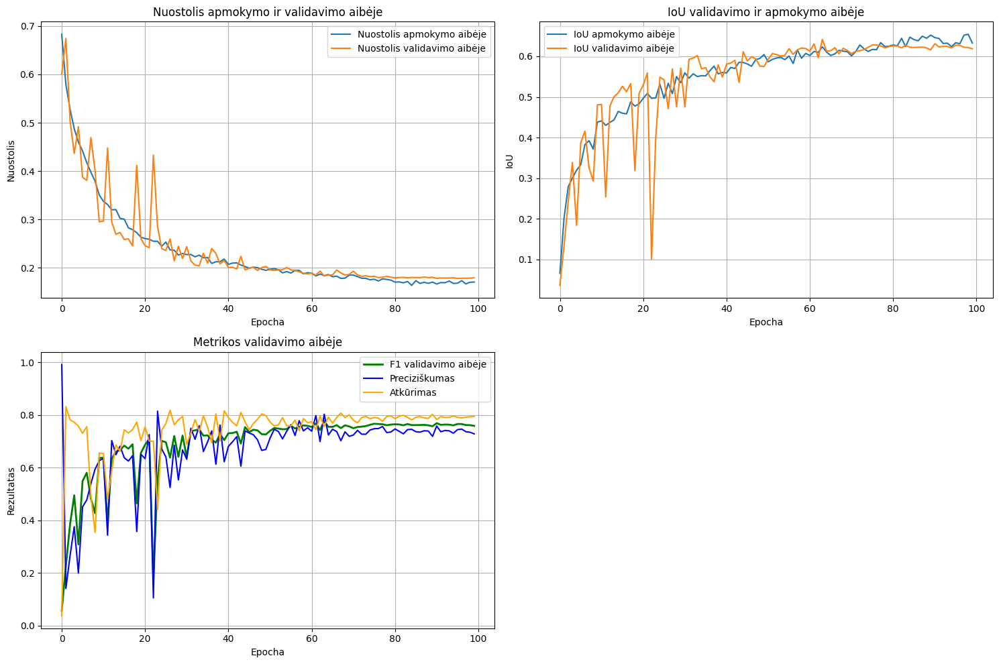

In [20]:
model = Seg(num_classes=NUM_CLASSES)
model = model.to(device)

criterion = CombinedLoss(alpha=LOSS_ALPHA)
# Optimizer based on the third study (Yao et al., 2025)
optimizer = optim.RMSprop(
    model.parameters(),
    lr=LEARNING_RATE_MAX,
    weight_decay=WEIGHT_DECAY
)
# Learning rate algorythm based on the third study (Yao et al., 2025)
scheduler = optim.lr_scheduler.CosineAnnealingLR(
    optimizer,
    T_max=NUM_EPOCHS,
    eta_min=LEARNING_RATE_MIN
)

history = {
    'train_loss': [],
    'train_iou': [],
    'val_loss': [],
    'val_iou': [],
    'val_precision': [],
    'val_recall': [],
    'val_f1': []
}

best_val_f1 = 0.0
best_epoch = 0

print(f"Training for {NUM_EPOCHS} epochs...")

for epoch in range(1, NUM_EPOCHS + 1):
    train_loss, train_iou = train_one_epoch(
        model, train_loader, criterion, optimizer, device, epoch, NUM_EPOCHS
    )

    val_loss, val_iou, val_precision, val_recall, val_f1 = validate(
        model, val_loader, criterion, device, epoch, NUM_EPOCHS
    )

    scheduler.step()

    history['train_loss'].append(train_loss)
    history['train_iou'].append(train_iou)
    history['val_loss'].append(val_loss)
    history['val_iou'].append(val_iou)
    history['val_precision'].append(val_precision)
    history['val_recall'].append(val_recall)
    history['val_f1'].append(val_f1)

    print(f"Epoch {epoch}/{NUM_EPOCHS} Summary:")
    print(f"   Train - Loss: {train_loss:.4f}, IoU: {train_iou:.4f}")
    print(f"   Val   - Loss: {val_loss:.4f}, IoU: {val_iou:.4f}, "
          f"F1: {val_f1:.4f}, Precision: {val_precision:.4f}, Recall: {val_recall:.4f}")

    if val_f1 > best_val_f1:
        best_val_f1 = val_f1
        best_epoch = epoch
        torch.save({
            'epoch': epoch,
            'model_state_dict': model.state_dict(),
            'optimizer_state_dict': optimizer.state_dict(),
            'val_f1': val_f1,
            'val_iou': val_iou,
        }, 'best_model.pth')
        print(f"Best model saved (F1: {val_f1:.4f})")


print(f"Best model: Epoch {best_epoch}, Val F1: {best_val_f1:.4f}")

fig, axes = plt.subplots(2, 2, figsize=(15, 10))

axes[0, 0].plot(history['train_loss'], label='Nuostolis apmokymo aibėje')
axes[0, 0].plot(history['val_loss'], label='Nuostolis validavimo aibėje')
axes[0, 0].set_xlabel('Epocha')
axes[0, 0].set_ylabel('Nuostolis')
axes[0, 0].set_title('Nuostolis apmokymo ir validavimo aibėje')
axes[0, 0].legend()
axes[0, 0].grid(True)

axes[0, 1].plot(history['train_iou'], label='IoU apmokymo aibėje')
axes[0, 1].plot(history['val_iou'], label='IoU validavimo aibėje')
axes[0, 1].set_xlabel('Epocha')
axes[0, 1].set_ylabel('IoU')
axes[0, 1].set_title('IoU validavimo ir apmokymo aibėje')
axes[0, 1].legend()
axes[0, 1].grid(True)

axes[1, 0].plot(history['val_f1'], label='F1 validavimo aibėje', color='green', linewidth=2)
axes[1, 0].plot(history['val_precision'], label='Preciziškumas', color='blue')
axes[1, 0].plot(history['val_recall'], label='Atkūrimas', color='orange')
axes[1, 0].set_title('Metrikos validavimo aibėje')
axes[1, 0].set_xlabel('Epocha')
axes[1, 0].set_ylabel('Rezultatas')
axes[1, 0].legend()
axes[1, 0].grid(True)

axes[1, 1].axis('off')

plt.tight_layout()
plt.savefig('training_curves.png', dpi=300, bbox_inches='tight')
plt.show()


Test loop and results

   Best Val F1: 77.68%
   Best Val IoU: 64.15%
Testing on 61 samples...


Testing: 100%|██████████| 8/8 [00:12<00:00,  1.51s/it]


Loss:      0.1989
IoU:       0.5394 (53.94%)
F1 Score:  0.6907 (69.07%)
Precision: 0.7849 (78.49%)
Recall:    0.6466 (64.66%)
True Negatives:   18667830
False Positives:  8232
False Negatives:  20861
True Positives:   42277
Total pixels:     18739200


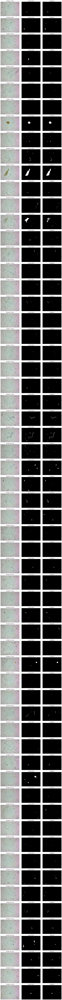

In [21]:
# Load best model and evaluate on test set
checkpoint = torch.load('best_model.pth')
model.load_state_dict(checkpoint['model_state_dict'])
model.eval()

print(f"   Best Val F1: {checkpoint['val_f1']*100:.2f}%")
print(f"   Best Val IoU: {checkpoint['val_iou']*100:.2f}%")

test_loss = 0
test_iou = 0
test_precision = 0
test_recall = 0
test_f1 = 0
num_test_batches = len(test_loader)

all_preds = []
all_targets = []

print(f"Testing on {len(test_dataset)} samples...")

with torch.no_grad():
    for images, masks in tqdm(test_loader, desc="Testing"):
        images = images.to(device)
        masks = masks.to(device)

        outputs = model(images)
        loss = criterion(outputs, masks)

        preds = torch.argmax(outputs, dim=1)

        iou = calculate_iou(preds, masks)
        precision, recall, f1 = calculate_metrics(preds, masks)

        test_loss += loss.item()
        test_iou += iou
        test_precision += precision
        test_recall += recall
        test_f1 += f1

        all_preds.append(preds.cpu().numpy())
        all_targets.append(masks.cpu().numpy())

test_loss /= num_test_batches
test_iou /= num_test_batches
test_precision /= num_test_batches
test_recall /= num_test_batches
test_f1 /= num_test_batches

print(f"Loss:      {test_loss:.4f}")
print(f"IoU:       {test_iou:.4f} ({test_iou*100:.2f}%)")
print(f"F1 Score:  {test_f1:.4f} ({test_f1*100:.2f}%)")
print(f"Precision: {test_precision:.4f} ({test_precision*100:.2f}%)")
print(f"Recall:    {test_recall:.4f} ({test_recall*100:.2f}%)")

all_preds_flat = np.concatenate([p.flatten() for p in all_preds])
all_targets_flat = np.concatenate([t.flatten() for t in all_targets])

cm = confusion_matrix(all_targets_flat, all_preds_flat)

tn, fp, fn, tp = cm.ravel()

print(f"True Negatives:   {tn}")
print(f"False Positives:  {fp}")
print(f"False Negatives:  {fn}")
print(f"True Positives:   {tp}")
print(f"Total pixels:     {tn+fp+fn+tp}")

model.eval()
all_test_samples = []
with torch.no_grad():
    for images, masks in tqdm(test_loader, desc="Collecting test samples"):
        images = images.to(device)
        outputs = model(images)
        preds = torch.argmax(outputs, dim=1)

        for i in range(len(images)):
            all_test_samples.append({
                'image': images[i].cpu(),
                'mask': masks[i].cpu(),
                'pred': preds[i].cpu()
            })

n_samples = len(all_test_samples)

n_cols = 3
n_rows = n_samples

fig, axes = plt.subplots(n_rows, n_cols, figsize=(12, 3 * n_rows))

if n_samples == 1:
    axes = axes.reshape(1, -1)

for idx, sample in enumerate(all_test_samples):
    # Denormalize image for visualization
    img = sample['image'].permute(1, 2, 0).numpy()
    img = img * np.array(STD) + np.array(MEAN)
    img = np.clip(img, 0, 1)

    mask_true = sample['mask'].numpy()
    mask_pred = sample['pred'].numpy()

    axes[idx, 0].imshow(img)
    axes[idx, 0].set_title(f'Sample {idx+1}: Input')
    axes[idx, 0].axis('off')

    axes[idx, 1].imshow(mask_true, cmap='gray')
    axes[idx, 1].set_title('Ground Truth')
    axes[idx, 1].axis('off')

    axes[idx, 2].imshow(mask_pred, cmap='gray')
    axes[idx, 2].set_title('Prediction')
    axes[idx, 2].axis('off')

plt.tight_layout()
plt.savefig('test_predictions_all.png', dpi=150, bbox_inches='tight')
plt.show()



In [22]:
def analyze_pixels(dataset):
    pixels = []
    for idx in range(len(dataset)):
        _, mask = dataset[idx]
        count = mask.sum().item() if isinstance(mask, torch.Tensor) else mask.sum()
        pixels.append(count)
    return {
        'mean': np.mean(pixels),
        'median': np.median(pixels),
        'small': sum(1 for p in pixels if p < 200),
        'large': sum(1 for p in pixels if p > 2000)
    }

val_stats = analyze_pixels(val_dataset)
test_stats = analyze_pixels(test_dataset)

print("          validation:    test:")
print(f"Mean pixels:    {val_stats['mean']:>6.0f}      {test_stats['mean']:>6.0f}")
print(f"Median pixels:  {val_stats['median']:>6.0f}      {test_stats['median']:>6.0f}")
print(f"Small:          {val_stats['small']:>6d}      {test_stats['small']:>6d}")
print(f"Large:          {val_stats['large']:>6d}      {test_stats['large']:>6d}")


          validation:    test:
Mean pixels:       766        1035
Median pixels:     237         415
Small:              28          19
Large:               7           6
